<a href="https://colab.research.google.com/github/sudeepmathew/Deep-Learning-Diabetic-Data/blob/master/Topic_Modeling_in_VOC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Topic Extraction From Customer Review of MG Hector

In [3]:
from google.colab import drive
drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


In [5]:
pip install pyLDAvis

     |████████████████████████████████| 1.6MB 3.5MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97711 sha256=73e325fa6295f20f17a47858d370b0404a95549a22cabc30d19ba2e9d2f15049
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [6]:
import pandas as pd
import nltk
from nltk import FreqDist
nltk.download('stopwords') # run this one time
import pandas as pd
pd.set_option("display.max_colwidth", 200)
import numpy as np
import re
import spacy

import gensim
from gensim import corpora

# libraries for visualization
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
data = pd.read_csv("/gdrive/My Drive/MGHectorComments.csv")

In [8]:
data.head()

,selection1_name
0,Quote:\nOriginally Posted by blackwasp\nThanks to Automobiles Encyclopedia for sending these images in.\nI have seen these quite a few times in the city too but never got a chance to click a pictu...
1,What's happening with the names of cars these days. First Harrier now Hector.\nHarrier also was out of place and Hector even more so. MG historically has been letters as names and MG India could h...
2,Quote:\nOriginally Posted by blackwasp\nThanks to Automobiles Encyclopedia for sending these images in. Heartfelt gratitude for sharing it with other enthusiasts via this Team-BHP page!\nAttachmen...
3,Just quickly Googled about this Hector/Baojun 530/Chevy Captiva ()??\nIs it true? Is Hector the 2019 Captiva? Just by looks? Or guts too?
4,Quote:\nOriginally Posted by rovingeye\nJust quickly Googled about this Hector/Baojun 530/Chevy Captiva ()??\nIs it true? Is Hector the 2019 Captiva? Just by looks? Or guts too?\nYou are bang on! ...


In [9]:
data.shape

(892, 1)

In [0]:
# function to plot most frequent terms
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top 20 most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  plt.show()

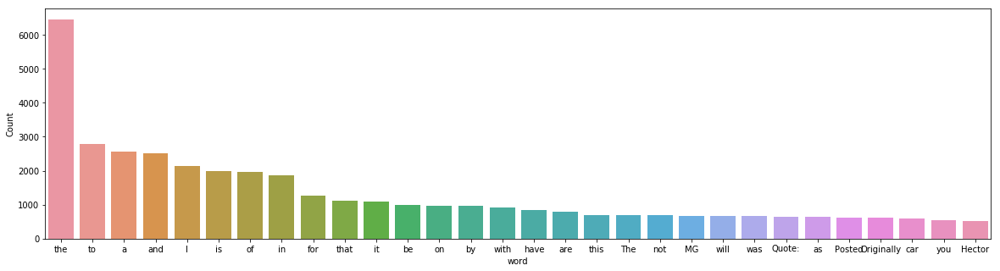

In [12]:
freq_words(data['selection1_name'])

**Remove Punctuation**

In [0]:
# remove unwanted characters, numbers and symbols
data['selection1_name'] = data['selection1_name'].str.replace("[^a-zA-Z#]", " ")

In [0]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

**StopWord Removal**

In [0]:
# function to remove stopwords
def remove_stopwords(rev):
    rev_new = " ".join([i for i in rev if i not in stop_words])
    return rev_new

# remove short words (length < 3)
data['selection1_name'] = data['selection1_name'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

# remove stopwords from the text
reviews = [remove_stopwords(r.split()) for r in data['selection1_name']]

# make entire text lowercase
reviews = [r.lower() for r in reviews]

In [16]:
reviews[0]

'quote originally posted blackwasp thanks automobiles encyclopedia sending images seen quite times city never got chance click picture seems quite imposing though'

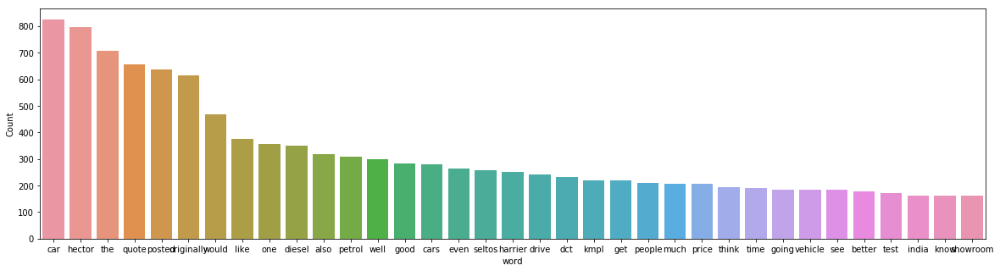

In [17]:
freq_words(reviews, 35)

In [18]:
!python -m spacy download en # one time run

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [0]:
nlp = spacy.load('en', disable=['parser', 'ner'])

def lemmatization(texts, tags=['NOUN', 'ADJ']): # filter noun and adjective
       output = []
       for sent in texts:
             doc = nlp(" ".join(sent)) 
             output.append([token.lemma_ for token in doc if token.pos_ in tags])
       return output

# **Tokenizing the Data**

In [20]:
#Tokenizing and dispalying first review
tokenized_reviews = pd.Series(reviews).apply(lambda x: x.split())
print(tokenized_reviews[1])

['what', 'happening', 'names', 'cars', 'days', 'first', 'harrier', 'hector', 'harrier', 'also', 'place', 'hector', 'even', 'historically', 'letters', 'names', 'india', 'could', 'kept', 'combination', 'when', 'back', 'historically', 'people', 'refer', 'even']


# Lemmatization

In [21]:
reviews_2 = lemmatization(tokenized_reviews)
print(reviews_2[1]) # print lemmatized review

['name', 'car', 'day', 'harri', 'hector', 'hector', 'name', 'india', 'combination', 'people']


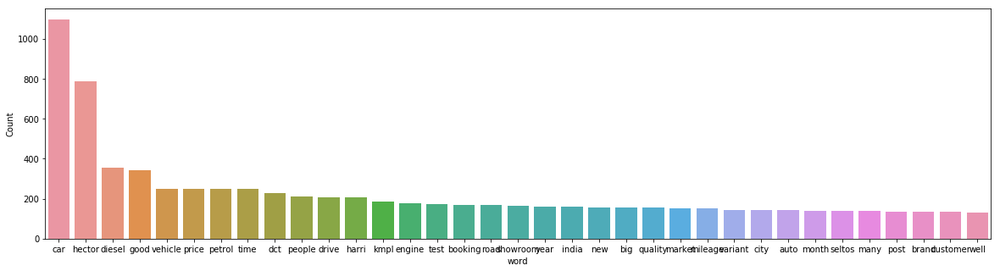

In [22]:
# Joing back to visualize the word frequency
reviews_3 = []
for i in range(len(reviews_2)):
    reviews_3.append(' '.join(reviews_2[i]))

data['reviews'] = reviews_3

freq_words(data['reviews'], 35)

In [0]:
dictionary = corpora.Dictionary(reviews_2)

In [0]:
doc_term_matrix = [dictionary.doc2bow(rev) for rev in reviews_2]

In [26]:
# Creating the object for LDA model using gensim library
LDA = gensim.models.ldamodel.LdaModel

# Build LDA model
lda_model = LDA(corpus=doc_term_matrix, id2word=dictionary, num_topics=7, random_state=100,
                chunksize=1000, passes=50)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [27]:
lda_model.print_topics()

[(0,
  '0.028*"hector" + 0.015*"petrol" + 0.015*"car" + 0.015*"diesel" + 0.014*"price" + 0.009*"dct" + 0.008*"showroom" + 0.008*"engine" + 0.008*"sharp" + 0.008*"variant"'),
 (1,
  '0.035*"kmpl" + 0.020*"mileage" + 0.017*"car" + 0.016*"traffic" + 0.016*"drive" + 0.015*"petrol" + 0.015*"highway" + 0.013*"city" + 0.010*"test" + 0.010*"mid"'),
 (2,
  '0.028*"car" + 0.023*"booking" + 0.020*"month" + 0.017*"hector" + 0.016*"delivery" + 0.008*"vehicle" + 0.008*"time" + 0.008*"production" + 0.008*"india" + 0.007*"dealer"'),
 (3,
  '0.032*"car" + 0.022*"hector" + 0.015*"diesel" + 0.014*"good" + 0.010*"dct" + 0.009*"test" + 0.009*"drive" + 0.009*"guy" + 0.007*"road" + 0.007*"city"'),
 (4,
  '0.027*"car" + 0.021*"hector" + 0.010*"rear" + 0.009*"vehicle" + 0.009*"quality" + 0.007*"good" + 0.007*"black" + 0.006*"wheel" + 0.006*"breakdown" + 0.006*"boot"'),
 (5,
  '0.030*"car" + 0.019*"hector" + 0.009*"diesel" + 0.009*"variant" + 0.008*"harri" + 0.008*"price" + 0.007*"good" + 0.007*"sunroof" + 0.00

In [28]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)
vis

/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.049363  0.031127       1        1  23.824198
5     -0.031315  0.039705       2        1  20.342592
6     -0.132677 -0.031177       3        1  13.892550
0     -0.025044 -0.068014       4        1  12.276341
1      0.227697 -0.011742       5        1  10.922222
4     -0.049955  0.162609       6        1   9.466494
2     -0.038069 -0.122509       7        1   9.275599, topic_info=     Category        Freq          Term       Total  loglift  logprob
657   Default  166.000000          kmpl  166.000000  30.0000  30.0000
669   Default  136.000000       mileage  136.000000  29.0000  29.0000
861   Default  147.000000       booking  147.000000  28.0000  28.0000
212   Default  123.000000         month  123.000000  27.0000  27.0000
558   Default   90.000000       traffic   90.000000  26.0000  26.0000
352   Default  224.000000        petrol  224.000000  25.0000  25.0000
66    Default  115.000000       chinese  115.000000  24.0000  24.0000
649   Default   72.000000       highway   72.000000  23.0000  23.0000
198   Default  112.000000       product  112.000000  22.0000  22.0000
13    Default  710.000000        hector  710.000000  21.0000  21.0000
99    Default  121.000000         brand  121.000000  20.0000  20.0000
545   Default  189.000000         drive  189.000000  19.0000  19.0000
336   Default  322.000000        diesel  322.000000  18.0000  18.0000
2     Default  131.000000          city  131.000000  17.0000  17.0000
1219  Default  119.000000       pricing  119.000000  16.0000  16.0000
870   Default  102.000000      delivery  102.000000  15.0000  15.0000
14    Default  141.000000         india  141.000000  14.0000  14.0000
236   Default  227.000000         price  227.000000  13.0000  13.0000
36    Default   83.000000          rear   83.000000  12.0000  12.0000
251   Default  156.000000          test  156.000000  11.0000  11.0000
116   Default  137.000000        market  137.000000  10.0000  10.0000
523   Default   55.000000           mid   55.000000   9.0000   9.0000
622   Default  206.000000           dct  206.000000   8.0000   8.0000
134   Default   82.000000        indian   82.000000   7.0000   7.0000
100   Default   42.000000       british   42.000000   6.0000   6.0000
88    Default  131.000000       variant  131.000000   5.0000   5.0000
12    Default  187.000000         harri  187.000000   4.0000   4.0000
1195  Default   35.000000         smart   35.000000   3.0000   3.0000
1048  Default   33.000000    production   33.000000   2.0000   2.0000
386   Default   78.000000       service   78.000000   1.0000   1.0000
...       ...         ...           ...         ...      ...      ...
1081   Topic7    6.955951         chaba    9.557806   2.0600  -6.2399
94     Topic7    8.918135         almaz   12.859255   2.0118  -5.9914
1501   Topic7    6.884042  cancellation    9.563048   2.0491  -6.2503
1485   Topic7    7.766728         delay   11.289369   2.0038  -6.1296
224    Topic7   14.854427        demand   26.430037   1.8016  -5.4812
728    Topic7   25.163977          week   53.145420   1.6302  -4.9540
2742   Topic7    7.796531         noida   11.388676   1.9988  -6.1258
2012   Topic7   14.812836        period   31.708652   1.6167  -5.4840
980    Topic7   15.250239          book   33.507900   1.5906  -5.4549
386    Topic7   26.070248       service   78.106415   1.2805  -4.9187
578    Topic7   17.518564        couple   45.228676   1.4293  -5.3162
9      Topic7  101.434174           car  989.563477   0.0999  -3.5601
1876   Topic7    9.643482      priority   17.432423   1.7857  -5.9132
1387   Topic7   11.180612          date   22.721127   1.6687  -5.7653
14     Topic7   27.928839         india  141.112473   0.7579  -4.8498
13     Topic7   59.620605        hector  710.294739  -0.0999  -4.0915
199    Topic7   21.500177          sale  100.128983   0.8394  -5.1114
906    Topic7   13.758631      question  